In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('netology_dataset.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92374 entries, 0 to 92373
Data columns (total 53 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   user_id              92374 non-null  int64  
 1   amount               92374 non-null  int64  
 2   is_invoice_sent      92374 non-null  int64  
 3   is_bundle            92374 non-null  int64  
 4   is_amo_lead          92374 non-null  int64  
 5   access_days          91514 non-null  float64
 6   start_date_dow       91514 non-null  float64
 7   d1_complete          92374 non-null  int64  
 8   d1_duration          92374 non-null  int64  
 9   d2_complete          92374 non-null  int64  
 10  d2_duration          92374 non-null  int64  
 11  d3_complete          92374 non-null  int64  
 12  d3_duration          92374 non-null  int64  
 13  d4_complete          92374 non-null  int64  
 14  d4_duration          92374 non-null  int64  
 15  d5_complete          92374 non-null 

In [4]:
df.dropna(subset = ["access_days"], inplace=True)

In [5]:
df['sent_messages_count'].fillna(0, inplace=True)

In [6]:
df['access_days'], df['start_date_dow'], df['sent_messages_count'] = df['access_days'].astype(int), df['start_date_dow'].astype(int), df['sent_messages_count'].astype(int)

In [7]:
df_filtered = df[['amount','is_invoice_sent','is_bundle','is_amo_lead','access_days','start_date_dow','d1_complete','d1_duration','d2_complete','d2_duration','d3_complete','d3_duration','d4_complete','d4_duration','d5_complete','d5_duration','d6_complete','d6_duration','d20_complete','start_selfie','dz1','sent_video','sent_messages_count']]

In [8]:
df_filtered.rename(columns={'d20_complete':'target'}, inplace=True)

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [9]:
df_filtered.head()

,amount,is_invoice_sent,is_bundle,is_amo_lead,access_days,start_date_dow,d1_complete,d1_duration,d2_complete,d2_duration,...,d4_duration,d5_complete,d5_duration,d6_complete,d6_duration,target,start_selfie,dz1,sent_video,sent_messages_count
4,1886,0,0,0,365,4,1,6,0,0,...,0,0,0,0,0,0,1,0,0,1
5,1990,0,0,0,365,6,1,1,0,0,...,0,0,0,0,0,0,1,0,0,0
6,3480,0,0,0,59,7,1,0,1,1,...,3,1,4,1,5,0,0,0,1,4
7,2350,0,0,0,365,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1904,0,0,1,365,4,1,6,1,8,...,14,1,34,1,41,0,1,0,0,0


In [15]:
# Стандартные импорты plotly
import chart_studio.plotly as py
#import plotly.plotly as py
#import plotly.graph_obs as go
from plotly.offline import iplot
import cufflinks as cf
cufflinks.go_offline()
# Устанавливаем глобальную тему 
cf.set_config_file(world_readable=True, theme='pearl', offline=True)

In [16]:
df_filtered['target'].iplot(kind='hist', xTitle='target',
                  yTitle='users', title='Target Distribution')

In [12]:
from pylab import rcParams
rcParams['figure.figsize'] = 12,9

import pandas as pd
import matplotlib.pyplot as plt

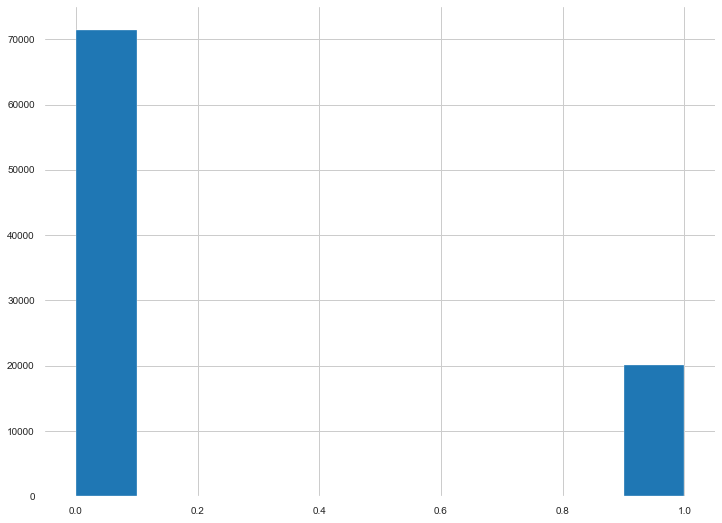

In [15]:
df_filtered.target.hist()

In [ ]:
plt.barh(df_filtered.target,df_filtered.target)

KeyboardInterrupt: 

In [10]:
import pandas_profiling

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [11]:
df_filtered.profile_report()

In [13]:
df_filtered.columns.to_list()

['amount',
 'is_invoice_sent',
 'is_bundle',
 'is_amo_lead',
 'access_days',
 'start_date_dow',
 'd1_complete',
 'd1_duration',
 'd2_complete',
 'd2_duration',
 'd3_complete',
 'd3_duration',
 'd4_complete',
 'd4_duration',
 'd5_complete',
 'd5_duration',
 'd6_complete',
 'd6_duration',
 'target',
 'start_selfie',
 'dz1',
 'sent_video',
 'sent_messages_count']

In [10]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [11]:
df_filtered.columns

Index(['amount', 'is_invoice_sent', 'is_bundle', 'is_amo_lead', 'access_days',
       'start_date_dow', 'd1_complete', 'd1_duration', 'd2_complete',
       'd2_duration', 'd3_complete', 'd3_duration', 'd4_complete',
       'd4_duration', 'd5_complete', 'd5_duration', 'd6_complete',
       'd6_duration', 'target', 'start_selfie', 'dz1', 'sent_video',
       'sent_messages_count'],
      dtype='object')

In [12]:
X, y = df_filtered[['amount', 'is_invoice_sent', 'is_bundle', 'is_amo_lead', 'access_days',
       'start_date_dow', 'd1_complete', 'd1_duration', 'd2_complete',
       'd2_duration', 'd3_complete', 'd3_duration', 'd4_complete',
       'd4_duration', 'd5_complete', 'd5_duration', 'd6_complete',
       'd6_duration', 'start_selfie', 'dz1', 'sent_video',
       'sent_messages_count']], df_filtered['target']

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [14]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [15]:
X_train = pd.DataFrame(X_train, columns=X.columns)
X_test = pd.DataFrame(X_test, columns=X.columns)

In [16]:
from sklearn.ensemble import RandomForestClassifier

In [17]:
clf = RandomForestClassifier(criterion='gini')

In [18]:
clf.fit(X_train, y_train)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [43]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [20]:
accuracy_score(y_test, clf.predict(X_test))

0.8446702726329017

In [21]:
precision_score(y_test, clf.predict(X_test))

0.6754210676562946

In [22]:
recall_score(y_test, clf.predict(X_test))

0.581041257367387

In [23]:
f1_score(y_test, clf.predict(X_test))

0.6246864686468646

Update

In [17]:
from sklearn.linear_model import LogisticRegression

In [25]:
logistic = LogisticRegression()

In [26]:
logistic.fit(X_train, y_train)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [27]:
accuracy_score(y_test, logistic.predict(X_test))

0.8303010435447741

In [28]:
precision_score(y_test, logistic.predict(X_test))

0.6699507389162561

In [29]:
recall_score(y_test, logistic.predict(X_test))

0.4675834970530452

In [30]:
f1_score(y_test, logistic.predict(X_test))

0.5507665606016777

In [18]:
from sklearn.svm import  SVC

In [32]:
svc = SVC()
svc.fit(X_train, y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [33]:
accuracy_score(y_test, svc.predict(X_test))

0.8505709446538818

In [34]:
precision_score(y_test, svc.predict(X_test))

0.6898608349900597

In [35]:
recall_score(y_test, svc.predict(X_test))

0.5965127701375246

In [36]:
f1_score(y_test, svc.predict(X_test))

0.6397998156196497

In [19]:
from sklearn.ensemble import GradientBoostingClassifier

In [38]:
gbc = GradientBoostingClassifier()
gbc.fit(X_train, y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [39]:
accuracy_score(y_test, gbc.predict(X_test))

0.8575096978637382

In [40]:
precision_score(y_test, gbc.predict(X_test))

0.697517539125742

In [41]:
recall_score(y_test, gbc.predict(X_test))

0.6348231827111984

In [42]:
f1_score(y_test, gbc.predict(X_test))

0.6646952944201595

Tuning hyper-parameters

In [20]:
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV

In [58]:
tuned_parameters = [{'kernel': ['rbf'], 'gamma': [1e-3, 1e-4],
                     'C': [1, 10, 100, 1000]},
                    {'kernel': ['linear'], 'C': [1, 10, 100, 1000]}]

In [45]:
#scores = ['precision', 'recall']

In [52]:
score = 'precision'

In [46]:
for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    clf = GridSearchCV(
        SVC(), tuned_parameters, scoring='%s_macro' % score
    )
    clf.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for precision



/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


Best parameters set found on development set:

{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}

Grid scores on development set:

0.766 (+/-0.007) for {'C': 1, 'gamma': 0.001, 'kernel': 'rbf'}
0.754 (+/-0.014) for {'C': 1, 'gamma': 0.0001, 'kernel': 'rbf'}
0.767 (+/-0.009) for {'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}
0.763 (+/-0.004) for {'C': 10, 'gamma': 0.0001, 'kernel': 'rbf'}
0.775 (+/-0.004) for {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
0.767 (+/-0.008) for {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
0.780 (+/-0.005) for {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
0.767 (+/-0.009) for {'C': 1000, 'gamma': 0.0001, 'kernel': 'rbf'}
0.765 (+/-0.008) for {'C': 1, 'kernel': 'linear'}
0.765 (+/-0.008) for {'C': 10, 'kernel': 'linear'}
0.765 (+/-0.008) for {'C': 100, 'kernel': 'linear'}
0.765 (+/-0.008) for {'C': 1000, 'kernel': 'linear'}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

           

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


Best parameters set found on development set:

{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}

Grid scores on development set:

0.683 (+/-0.006) for {'C': 1, 'gamma': 0.001, 'kernel': 'rbf'}
0.562 (+/-0.001) for {'C': 1, 'gamma': 0.0001, 'kernel': 'rbf'}
0.706 (+/-0.010) for {'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}
0.671 (+/-0.003) for {'C': 10, 'gamma': 0.0001, 'kernel': 'rbf'}
0.729 (+/-0.008) for {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
0.701 (+/-0.009) for {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
0.737 (+/-0.006) for {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
0.706 (+/-0.011) for {'C': 1000, 'gamma': 0.0001, 'kernel': 'rbf'}
0.700 (+/-0.010) for {'C': 1, 'kernel': 'linear'}
0.700 (+/-0.010) for {'C': 10, 'kernel': 'linear'}
0.700 (+/-0.010) for {'C': 100, 'kernel': 'linear'}
0.702 (+/-0.009) for {'C': 1000, 'kernel': 'linear'}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

           

In [ ]:
clf = GridSearchCV(
    SVC(), tuned_parameters, scoring='precision'
)
clf.fit(X_train, y_train)

print("Best parameters set found on development set:")
print()
print(clf.best_params_)
print()
print("Grid scores on development set:")
print()
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
          % (mean, std * 2, params))
print()

print("Detailed classification report:")
print()
print("The model is trained on the full development set.")
print("The scores are computed on the full evaluation set.")
print()
y_true, y_pred = y_test, clf.predict(X_test)
print(classification_report(y_true, y_pred))
print()

Fit with new parameters

In [45]:
svc = SVC(C=1000, kernel='rbf', gamma=0.001)
svc.fit(X_train, y_train)

SVC(C=1000, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.001, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [46]:
accuracy_score(y_test, svc.predict(X_test))

0.8427580178112878

In [47]:
precision_score(y_test, svc.predict(X_test))

0.6832412523020258

In [48]:
recall_score(y_test, gbc.predict(X_test))

0.6348231827111984

In [49]:
f1_score(y_test, gbc.predict(X_test))

0.6646952944201595

In [67]:
tuned_parameters = { 
    'n_estimators': [200, 700],
    'max_features': ['auto', 'sqrt', 'log2']
}

In [68]:
clf = GridSearchCV(
    RandomForestClassifier(n_jobs=-1,max_features= 'sqrt' ,n_estimators=50, oob_score = True),
    tuned_parameters, scoring='precision'
)
clf.fit(X_train, y_train)

print("Best parameters set found on development set:")
print()
print(clf.best_params_)
print()
print("Grid scores on development set:")
print()
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
          % (mean, std * 2, params))
print()

print("Detailed classification report:")
print()
print("The model is trained on the full development set.")
print("The scores are computed on the full evaluation set.")
print()
y_true, y_pred = y_test, clf.predict(X_test)
print(classification_report(y_true, y_pred))
print()

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


Best parameters set found on development set:

{'max_features': 'log2', 'n_estimators': 700}

Grid scores on development set:

0.682 (+/-0.007) for {'max_features': 'auto', 'n_estimators': 200}
0.682 (+/-0.001) for {'max_features': 'auto', 'n_estimators': 700}
0.680 (+/-0.002) for {'max_features': 'sqrt', 'n_estimators': 200}
0.682 (+/-0.004) for {'max_features': 'sqrt', 'n_estimators': 700}
0.682 (+/-0.001) for {'max_features': 'log2', 'n_estimators': 200}
0.682 (+/-0.003) for {'max_features': 'log2', 'n_estimators': 700}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.89      0.92      0.91     14231
           1       0.68      0.62      0.65      4072

    accuracy                           0.85     18303
   macro avg       0.79      0.77      0.78     18303
weighted avg       0.85      0.85      0.85     18303




In [76]:
clf = RandomForestClassifier(n_jobs=-1, oob_score = True,
                             max_features='log2', n_estimators=700)

In [77]:
clf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=700,
                       n_jobs=-1, oob_score=True, random_state=None, verbose=0,
                       warm_start=False)

In [78]:
accuracy_score(y_test, clf.predict(X_test))

0.8518275692509425

In [79]:
precision_score(y_test, clf.predict(X_test))

0.6818181818181818

In [80]:
recall_score(y_test, clf.predict(X_test))

0.6262278978388998

In [81]:
f1_score(y_test, clf.predict(X_test))

0.65284178187404

In [21]:
import numpy as np

In [91]:
tuned_parameters = {'penalty' : ['l1', 'l2'],
    'C' : np.logspace(-4, 4, 20),
    'solver' : ['liblinear']}

In [92]:
clf = GridSearchCV(
    LogisticRegression(),
    tuned_parameters, scoring='precision'
)
clf.fit(X_train, y_train)

print("Best parameters set found on development set:")
print()
print(clf.best_params_)
print()
print("Grid scores on development set:")
print()
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
          % (mean, std * 2, params))
print()

print("Detailed classification report:")
print()
print("The model is trained on the full development set.")
print("The scores are computed on the full evaluation set.")
print()
y_true, y_pred = y_test, clf.predict(X_test)
print(classification_report(y_true, y_pred))
print()

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


Best parameters set found on development set:

{'C': 0.0001, 'penalty': 'l1', 'solver': 'liblinear'}

Grid scores on development set:

0.778 (+/-0.416) for {'C': 0.0001, 'penalty': 'l1', 'solver': 'liblinear'}
0.625 (+/-0.004) for {'C': 0.0001, 'penalty': 'l2', 'solver': 'liblinear'}
0.655 (+/-0.021) for {'C': 0.00026366508987303583, 'penalty': 'l1', 'solver': 'liblinear'}
0.660 (+/-0.006) for {'C': 0.00026366508987303583, 'penalty': 'l2', 'solver': 'liblinear'}
0.656 (+/-0.013) for {'C': 0.0006951927961775605, 'penalty': 'l1', 'solver': 'liblinear'}
0.670 (+/-0.008) for {'C': 0.0006951927961775605, 'penalty': 'l2', 'solver': 'liblinear'}
0.663 (+/-0.012) for {'C': 0.0018329807108324356, 'penalty': 'l1', 'solver': 'liblinear'}
0.672 (+/-0.007) for {'C': 0.0018329807108324356, 'penalty': 'l2', 'solver': 'liblinear'}
0.676 (+/-0.006) for {'C': 0.004832930238571752, 'penalty': 'l1', 'solver': 'liblinear'}
0.673 (+/-0.007) for {'C': 0.004832930238571752, 'penalty': 'l2', 'solver': 'libline

In [95]:
logistic = LogisticRegression(C=0.0001, penalty='l1', solver='liblinear')

In [96]:
logistic.fit(X_train, y_train)

LogisticRegression(C=0.0001, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [97]:
accuracy_score(y_test, logistic.predict(X_test))

0.7917827678522646

In [98]:
precision_score(y_test, logistic.predict(X_test))

0.6343975283213182

In [99]:
recall_score(y_test, logistic.predict(X_test))

0.1512770137524558

In [100]:
f1_score(y_test, logistic.predict(X_test))

0.24429902835613723

In [103]:
tuned_parameters = {
    "loss":["deviance"],
    "learning_rate": [0.01, 0.025, 0.05, 0.075, 0.1, 0.15, 0.2],
    "min_samples_split": np.linspace(0.1, 0.5, 12),
    "min_samples_leaf": np.linspace(0.1, 0.5, 12),
    "max_depth":[3,5,8],
    "max_features":["log2","sqrt"],
    "criterion": ["friedman_mse",  "mae"],
    "subsample":[0.5, 0.618, 0.8, 0.85, 0.9, 0.95, 1.0],
    "n_estimators":[10]
    }

In [105]:
from sklearn.metrics import make_scorer

scoring = {'accuracy': make_scorer(accuracy_score),
           'precision': make_scorer(precision_score),'recall':make_scorer(recall_score)}

In [106]:
clf = GridSearchCV(
    GradientBoostingClassifier(),
    tuned_parameters, scoring=scoring,refit=False,cv=2, n_jobs=-1
)
clf.fit(X_train, y_train)

print("Best parameters set found on development set:")
print()
print(clf.best_params_)
print()
print("Grid scores on development set:")
print()
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r"
          % (mean, std * 2, params))
print()

print("Detailed classification report:")
print()
print("The model is trained on the full development set.")
print("The scores are computed on the full evaluation set.")
print()
y_true, y_pred = y_test, clf.predict(X_test)
print(classification_report(y_true, y_pred))
print()

KeyboardInterrupt: 

Update with RandomizedSearchCV

In [33]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt

In [34]:
model = GradientBoostingClassifier()

In [35]:
parameters = {'learning_rate': sp_randFloat(),
              'subsample'    : sp_randFloat(),
              'n_estimators' : sp_randInt(100, 1000),
              'max_depth'    : sp_randInt(4, 10) 
             }

In [36]:
randm = RandomizedSearchCV(estimator=model, param_distributions = parameters, 
                           cv = 2, n_iter = 10, n_jobs=-1)

In [48]:
def Snippet_196(): 
    print()
    print(format('Finding parameters using RandomizedSearchCV','*^82'))    
    
    import warnings
    warnings.filterwarnings("ignore")
    
    from sklearn.model_selection import RandomizedSearchCV
    from scipy.stats import uniform as sp_randFloat
    from scipy.stats import randint as sp_randInt    

    model = GradientBoostingClassifier()
    parameters = {'learning_rate': sp_randFloat(),
                  'subsample'    : sp_randFloat(),
                  'n_estimators' : sp_randInt(10, 500),
                  'max_depth'    : sp_randInt(4, 10) 
                 }
    
    randm = RandomizedSearchCV(estimator=model, param_distributions = parameters, 
                               cv = 2, n_iter = 10, n_jobs=-1)
    randm.fit(X_train, y_train)

    # Results from Random Search
    print("\n========================================================")
    print(" Results from Random Search " )
    print("========================================================")    
    
    print("\n The best estimator across ALL searched params:\n",
          randm.best_estimator_)
    
    print("\n The best score across ALL searched params:\n",
          randm.best_score_)
    
    print("\n The best parameters across ALL searched params:\n",
          randm.best_params_)
    
    print("\n ========================================================")
Snippet_196()


*******************Finding parameters using RandomizedSearchCV********************

 Results from Random Search 

 The best estimator across ALL searched params:
 GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.019596076837506193, loss='deviance',
                           max_depth=9, max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=181,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=0.6626515189377736,
                           tol=0.0001, validation_fraction=0.1, verbose=0,
                           warm_start=False)

 The best score across ALL searched params:
 0.8610044938602123

 The best parameters across ALL searched params:
 {'learning_r

In [40]:
gbc = GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.029396546774015375, loss='deviance',
                           max_depth=9, max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=244,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=0.44820326091258644,
                           tol=0.0001, validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [41]:
gbc.fit(X_train, y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.029396546774015375, loss='deviance',
                           max_depth=9, max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=244,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=0.44820326091258644,
                           tol=0.0001, validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [44]:
accuracy_score(y_test, gbc.predict(X_test))

0.8637381849969951

In [45]:
precision_score(y_test, gbc.predict(X_test))

0.6993961669729588

In [46]:
recall_score(y_test, gbc.predict(X_test))

0.6638425118365313

In [47]:
f1_score(y_test, gbc.predict(X_test))

0.6811557146509845